# Miguel Hidalgo
## Miguel Hidalgo is the next Alcaldia with the most colonias after Benito Juarez

In [ ]:
miguel_hidalgo_data = merged_2023_2024_stations[merged_2023_2024_stations['Alcaldia'] == 'Miguel Hidalgo']

# Group by 'Colonia' and count the number of trips
trip_count_per_colonia = miguel_hidalgo_data.groupby('Colonia').size().reset_index(name='Trip_Count')

# Group by 'Colonia' and count the number of unique Station_IDs
station_count_per_colonia = miguel_hidalgo_data.groupby('Colonia')['Station_ID'].nunique().reset_index(name='Station_Count')

# Merge the trip count and station count dataframes
merged_data = trip_count_per_colonia.merge(station_count_per_colonia, on='Colonia')

# Sort the data by trip count and select the top colonias
merged_data = merged_data.sort_values(by='Trip_Count', ascending=False)

# Create a bar chart for trip counts
fig = go.Figure()

fig.add_trace(
    go.Bar(
        x=merged_data['Colonia'],
        y=merged_data['Trip_Count'],
        name='Number of Trips',
        marker_color='blue',
        yaxis='y1'
    )
)

# Add a line for the number of stations
fig.add_trace(
    go.Scatter(
        x=merged_data['Colonia'],
        y=merged_data['Station_Count'],
        mode='lines+markers',
        name='Number of Stations',
        marker_color='red',
        yaxis='y2'
    )
)

# Update layout to include secondary y-axis
fig.update_layout(
    title='Number of Trips and Stations per Colonia in miguel hidalgo 2023-2024',
    xaxis=dict(
        title='Colonia',
        tickangle=-45
    ),
    yaxis=dict(
        title='Number of Trips',
        titlefont=dict(color='blue'),
        tickfont=dict(color='blue')
    ),
    yaxis2=dict(
        title='Number of Stations',
        titlefont=dict(color='red'),
        tickfont=dict(color='red'),
        overlaying='y',
        side='right'
    ),
    legend=dict(
        x=0.1,
        y=1.1,
        orientation='h'
    ),
    title_font_size=18,
    xaxis_title_font_size=14,
    yaxis_title_font_size=14,
    height=600  # Set the height of the chart
)

# Show the plot
fig.show()

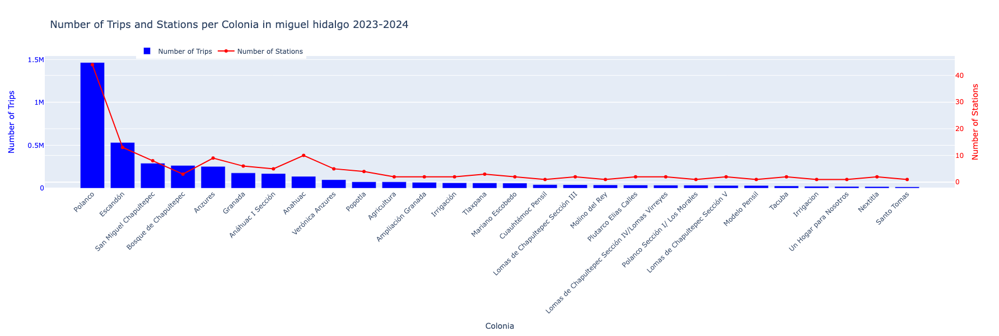

### Polanco by far has the most trips taken with Escandon leading in second place
### Huge difference in station counts
### Polanco has 44 stations and Escandon has 13 and anahuac has 10 
### Some correlation is present, high number of stations leads to high numbner of trips taken
### I will focus again on the top 10 colonias for further analysis

In [ ]:
# Group by 'Colonia' and calculate the average trip duration
avg_trip_duration_per_colonia = miguel_hidalgo_data.groupby('Colonia')['Trip_Duration'].mean().reset_index(name='Avg_Trip_Duration')

# Group by 'Colonia' and count the number of unique Station_IDs
station_count_per_colonia = miguel_hidalgo_data.groupby('Colonia')['Station_ID'].nunique().reset_index(name='Station_Count')

# Merge the average trip duration and station count dataframes
merged_data = avg_trip_duration_per_colonia.merge(station_count_per_colonia, on='Colonia')

# Sort the data by average trip duration
top_10_merged_data = merged_data.sort_values(by='Avg_Trip_Duration', ascending=False).head(10)

# Create a bar chart for average trip duration
fig = go.Figure()

fig.add_trace(
    go.Bar(
        x=top_10_merged_data['Colonia'],
        y=top_10_merged_data['Avg_Trip_Duration'],
        name='Average Trip Duration (minutes)',
        marker_color='blue',
        yaxis='y1'
    )
)

# Add a line for the number of stations
fig.add_trace(
    go.Scatter(
        x=top_10_merged_data['Colonia'],
        y=top_10_merged_data['Station_Count'],
        mode='lines+markers',
        name='Number of Stations',
        marker_color='red',
        yaxis='y2'
    )
)

# Update layout to include secondary y-axis
fig.update_layout(
    title='Average Trip Duration and Number of Stations per Colonia in Miguel Hidalgo (2023-2024)',
    xaxis=dict(
        title='Colonia',
        tickangle=-45
    ),
    yaxis=dict(
        title='Average Trip Duration (minutes)',
        titlefont=dict(color='blue'),
        tickfont=dict(color='blue')
    ),
    yaxis2=dict(
        title='Number of Stations',
        titlefont=dict(color='red'),
        tickfont=dict(color='red'),
        overlaying='y',
        side='right'
    ),
    legend=dict(
        x=0.1,
        y=1.1,
        orientation='h'
    ),
    title_font_size=18,
    xaxis_title_font_size=14,
    yaxis_title_font_size=14,
    height=600  # Set the height of the chart
)

# Show the plot
fig.show()

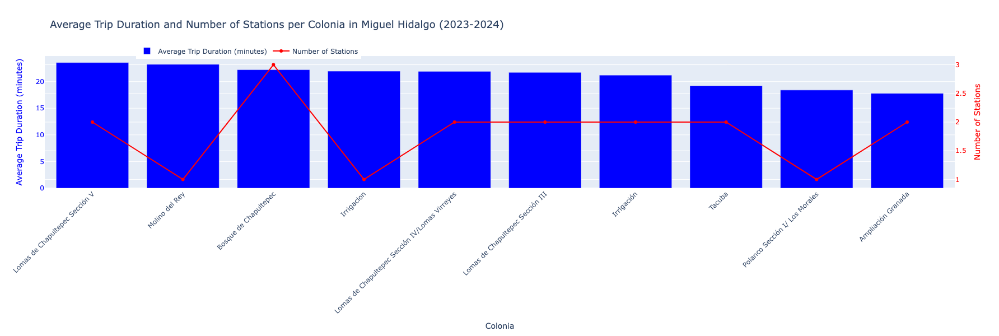

### Polanco does not apear in the top 10 avg trip duration colonias
### this may be again because polanco has over 40 stations while the ones shown above have a max of 3 atations which is Bosque Chapultepec which is a park 
### Lomas de Chapultepc show the highest avg trip duration, this may be since Lomas is on the outskirt of Miguel Hidalgo which I will visualize below with a red pin

In [ ]:
# Extract coordinates for all unique stations in Benito Juárez
coords = miguel_hidalgo_data[['Latitude', 'Longitude']].drop_duplicates().values

# Compute the convex hull for all unique stations
hull = ConvexHull(coords)
hull_coords = [coords[vertex].tolist() for vertex in hull.vertices] + [coords[hull.vertices[0]].tolist()]

# Group by 'Station_ID' and calculate the average trip duration for the top 10 stations
avg_trip_duration_per_station = miguel_hidalgo_data.groupby(['Station_ID', 'Colonia', 'Latitude', 'Longitude'])['Trip_Duration'].mean().reset_index(name='Avg_Trip_Duration')
top_10_stations = avg_trip_duration_per_station.sort_values(by='Avg_Trip_Duration', ascending=False).head(10)

# Generate a color map for the top 10 stations
colors = plt.cm.get_cmap('tab10', 10).colors  # 'tab10' is a colormap with 10 colors
color_map = {station: colors[i] for i, station in enumerate(top_10_stations['Station_ID'])}
color_map_hex = {station: mcolors.rgb2hex(color) for station, color in color_map.items()}

# Create a Folium map centered at the mean latitude and longitude of the top 10 stations
mean_lat_lon = top_10_stations[['Latitude', 'Longitude']].mean()
map_center = [mean_lat_lon['Latitude'], mean_lat_lon['Longitude']]
mymap = folium.Map(location=map_center, zoom_start=14)

# Add a polygon layer for the Benito Juárez boundary
folium.Polygon(
    locations=hull_coords,
    color='blue',
    fill=True,
    fill_opacity=0.2,
    weight=2,
    popup='Miguel Hidalgo Area'
).add_to(mymap)

# Add a marker for each of the top 10 stations with color based on Station_ID
for idx, row in top_10_stations.iterrows():
    folium.Marker(
        location=[row['Latitude'], row['Longitude']],
        popup=f"Station: {row['Station_ID']}<br>Colonia: {row['Colonia']}<br>Avg Trip Duration: {row['Avg_Trip_Duration']:.2f} minutes",
        icon=folium.Icon(color='blue', icon_color=color_map_hex[row['Station_ID']])
    ).add_to(mymap)

title_html = '''
     <div style="position: fixed; 
     top: 10px; left: 60%; transform: translateX(-50%); width: auto; height: auto; 
     background-color: white; z-index:9999; font-size:22px;
     border:2px solid grey; border-radius: 10px; padding: 5px;">
     <b>Top 10 Stations by Avg Trip Duration Miguel Hidalgo</b>
     </div>
     '''
mymap.get_root().html.add_child(folium.Element(title_html))

# Add a legend for top 10 stations
legend_html = '''
     <div style="position: absolute; 
     top: 50px; left: 50px; width: 250px; height: 490px; 
     background-color: white; z-index:9999; font-size:16px;
     border:2px solid grey; border-radius: 10px; padding: 16px;">
     <b>Stations</b><br>
     '''
for idx, row in top_10_stations.iterrows():
    legend_html += f'<i style="background:{color_map_hex[row["Station_ID"]]}; width: 10px; height: 10px; display: inline-block;"></i> Station {row["Station_ID"]}: {row["Colonia"]}<br>'
legend_html += '</div>'

mymap.get_root().html.add_child(folium.Element(legend_html))

# Display the map
mymap

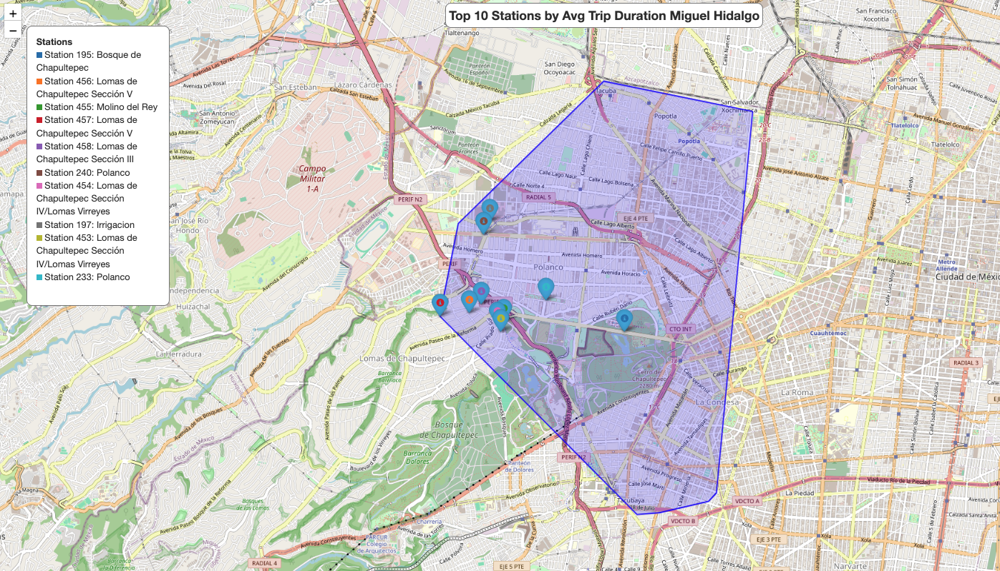

### Just as I suspected,  the stations shown above are clustered on one corner of Miguel Hidlago
### With one station in Bosque Chapultepec with which is within the largest park in mexico city

In [ ]:
# Group by 'Station_ID' and count the number of trips for the top 10 stations
trip_count_per_station = miguel_hidalgo_data.groupby(['Station_ID', 'Colonia', 'Latitude', 'Longitude']).size().reset_index(name='Trip_Count')
top_10_stations = trip_count_per_station.sort_values(by='Trip_Count', ascending=False).head(10)

# Generate a color map for the top 10 stations
colors = plt.cm.get_cmap('tab20', 10).colors  # 'tab20' is a colormap with 20 colors
color_map = {station: colors[i] for i, station in enumerate(top_10_stations['Station_ID'])}
color_map_hex = {station: mcolors.rgb2hex(color) for station, color in color_map.items()}

# Create a Folium map centered at the mean latitude and longitude of the top 10 stations
mean_lat_lon = top_10_stations[['Latitude', 'Longitude']].mean()
map_center = [mean_lat_lon['Latitude'], mean_lat_lon['Longitude']]
mymap = folium.Map(location=map_center, zoom_start=14)

# Add a polygon layer for the Miguel Hidalgo boundary
folium.Polygon(
    locations=hull_coords,
    color='blue',
    fill=True,
    fill_opacity=0.2,
    weight=2,
    popup='Miguel Hidalgo Area'
).add_to(mymap)

# Add a marker for each of the top 10 stations with color based on Station_ID
for idx, row in top_10_stations.iterrows():
    folium.Marker(
        location=[row['Latitude'], row['Longitude']],
        popup=f"Station: {row['Station_ID']}<br>Colonia: {row['Colonia']}<br>Trip Count: {row['Trip_Count']}",
        icon=folium.Icon(color='blue', icon_color=color_map_hex[row['Station_ID']])
    ).add_to(mymap)

title_html = '''
     <div style="position: fixed; 
     top: 10px; left: 60%; transform: translateX(-50%); width: auto; height: auto; 
     background-color: white; z-index:9999; font-size:22px;
     border:2px solid grey; border-radius: 10px; padding: 5px;">
     <b>Top 10 Stations by Trip count Miguel Hidalgo</b>
     </div>
     '''
mymap.get_root().html.add_child(folium.Element(title_html))

# Add a legend for top 10 stations
legend_html = '''
     <div style="position: absolute; 
     top: 50px; left: 50px; width: 250px; height: 400px; 
     background-color: white; z-index:9999; font-size:16px;
     border:2px solid grey; border-radius: 10px; padding: 16px;">
     <b>Stations</b><br>
     '''
for idx, row in top_10_stations.iterrows():
    legend_html += f'<i style="background:{color_map_hex[row["Station_ID"]]}; width: 10px; height: 10px; display: inline-block;"></i> Station {row["Station_ID"]}: {row["Colonia"]}<br>'
legend_html += '</div>'

mymap.get_root().html.add_child(folium.Element(legend_html))

# Display the map
mymap


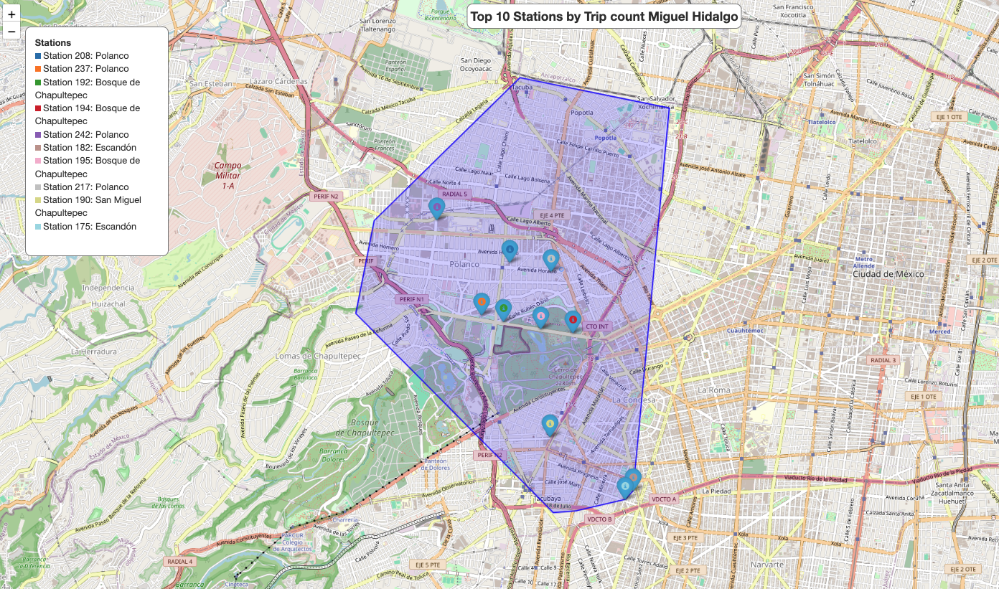

### Escandon is the second highest colonia for trip count and is located on the corner/edge of miguel hidalgo which neighbors Benito Juarez
### The other colonias are either on a main avenue and also inside the park limits of bosque chapultepec

In [ ]:
# Group by 'Month' and 'Colonia' and count the number of trips
trip_count_per_month_colonia = miguel_hidalgo_data.groupby(['Month', 'Colonia']).size().reset_index(name='Trip_Count')

# Get the top 10 colonias for each month
top_10_colonias_per_month_count = trip_count_per_month_colonia.groupby('Month').apply(lambda x: x.nlargest(10, 'Trip_Count')).reset_index(drop=True)

# Create a bar chart
fig = px.bar(top_10_colonias_per_month_count, x='Month', y='Trip_Count', color='Colonia', barmode='group',
             title='Top 10 Colonias by Number of Trips per Month in Miguel Hidalgo 2023-2024',
             labels={'Month': 'Month', 'Trip_Count': 'Number of Trips', 'Colonia': 'Colonia'})

# Customize the layout for better readability
fig.update_layout(
    xaxis_title='Month',
    yaxis_title='Number of Trips',
    xaxis_tickangle=-45,
    title_font_size=18,
    xaxis_title_font_size=14,
    yaxis_title_font_size=14,
    height=600  # Set the height of the chart
)

# Update x-axis ticks to show month names
fig.update_xaxes(tickmode='array', tickvals=[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12],
                 ticktext=['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])

# Show the plot
fig.show()

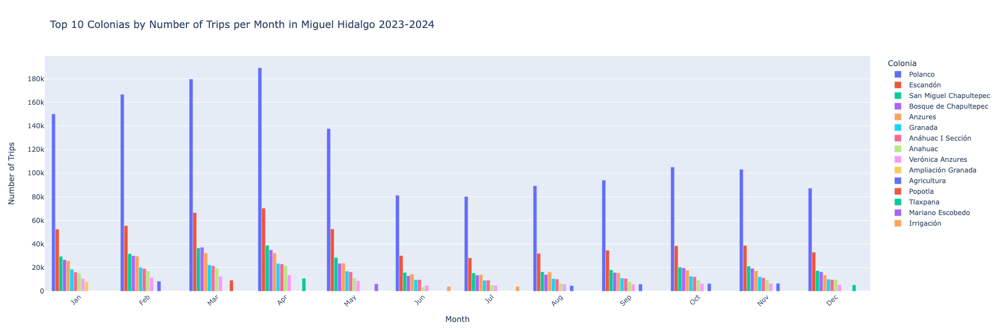

### January - May are the months with the hghest number of trips
### Polanco leads by more than half than other colonias

In [ ]:
# Group by 'Month' and 'Colonia' and calculate the average trip duration
avg_trip_duration_per_month_colonia = miguel_hidalgo_data.groupby(['Month', 'Colonia'])['Trip_Duration'].mean().reset_index(name='Avg_Trip_Duration')

# Get the top 10 colonias for each month by average trip duration
top_10_colonias_per_month_duration = avg_trip_duration_per_month_colonia.groupby('Month').apply(lambda x: x.nlargest(10, 'Avg_Trip_Duration')).reset_index(drop=True)

# Create a bar chart
fig = px.bar(top_10_colonias_per_month_duration, x='Month', y='Avg_Trip_Duration', color='Colonia', barmode='group',
             title='Top 10 Colonias by Average Trip Duration per Month in Miguel Hidalgo (2023-2024)',
             labels={'Month': 'Month', 'Avg_Trip_Duration': 'Average Trip Duration (minutes)', 'Colonia': 'Colonia'})

# Customize the layout for better readability
fig.update_layout(
    xaxis_title='Month',
    yaxis_title='Average Trip Duration (minutes)',
    xaxis_tickangle=-45,
    title_font_size=18,
    xaxis_title_font_size=14,
    yaxis_title_font_size=14,
    height=600  # Set the height of the chart
)

# Update x-axis ticks to show month names
fig.update_xaxes(tickmode='array', tickvals=[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12],
                 ticktext=['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])

# Show the plot
fig.show()

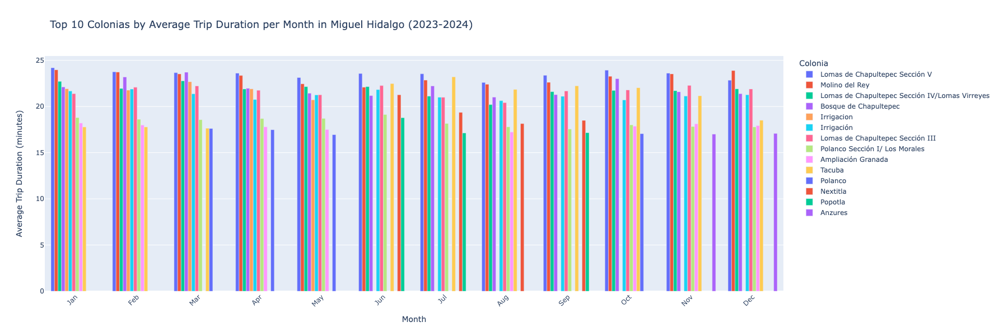

### Monthly avg trip duration does not show colonias that stand out as much 
### Lomas chapultepec, Molino del rey, bosque chapultepec and tacuba stand out with higher avg trip durations

In [ ]:
# Extract the unique colonias from the top 10 lists
top_colonias_count = top_10_colonias_per_month_count['Colonia'].unique()

# Filter the original data to include only the top colonias
filtered_data_count = miguel_hidalgo_data[miguel_hidalgo_data['Colonia'].isin(top_colonias_count)]

# Group by 'Colonia' and 'Age_Group' and count the number of trips
trip_count_per_colonia_age_group = filtered_data_count.groupby(['Colonia', 'Age_Group']).size().reset_index(name='Trip_Count')

# Create a bar chart
fig = px.bar(trip_count_per_colonia_age_group, x='Colonia', y='Trip_Count', color='Age_Group', barmode='group',
             title='Trip Counts for Each Age Group in Top Colonias of Miguel Hidalgo 2023-2024',
             labels={'Colonia': 'Colonia', 'Trip_Count': 'Number of Trips', 'Age_Group': 'Age Group'})

# Customize the layout for better readability
fig.update_layout(
    xaxis_title='Colonia',
    yaxis_title='Number of Trips',
    xaxis_tickangle=-45,
    title_font_size=18,
    xaxis_title_font_size=14,
    yaxis_title_font_size=14,
    height=600  # Set the height of the chart
)

# Show the plot
fig.show()

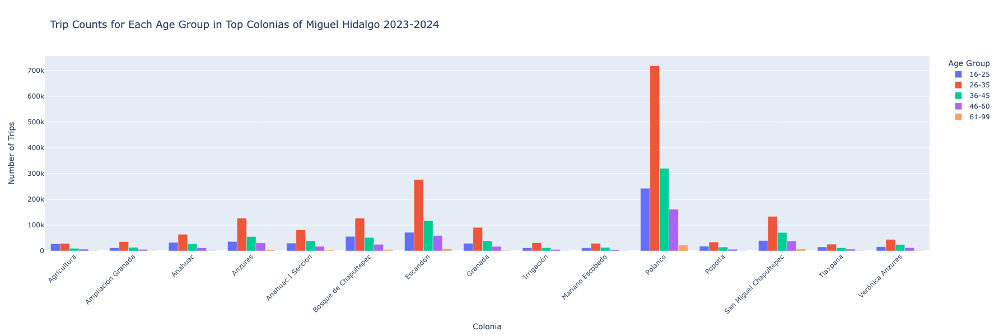

### Polanco records 26-35 as the leader in trips taken, then 36-45 and 16-25
### Other colonias record 16-25 age group as the second highest 

In [ ]:
# Extract the unique colonias from the top 10 lists
top_colonias = top_10_colonias_per_month_duration['Colonia'].unique()

# Filter the original data to include only the top colonias
filtered_data = miguel_hidalgo_data[miguel_hidalgo_data['Colonia'].isin(top_colonias)]

# Group by 'Colonia', 'Age_Group', and 'Month' to calculate the average trip duration for each age group in these colonias
avg_trip_duration_per_colonia_age_group = filtered_data.groupby(['Colonia', 'Age_Group'])['Trip_Duration'].mean().reset_index(name='Avg_Trip_Duration')

# Create a bar chart
fig = px.bar(avg_trip_duration_per_colonia_age_group, x='Colonia', y='Avg_Trip_Duration', color='Age_Group', barmode='group',
             title='Average Trip Duration by Age Group in Top Colonias of Miguel Hidalgo (2023-2024)',
             labels={'Colonia': 'Colonia', 'Avg_Trip_Duration': 'Average Trip Duration (minutes)', 'Age_Group': 'Age Group'})

# Customize the layout for better readability
fig.update_layout(
    xaxis_title='Colonia',
    yaxis_title='Average Trip Duration (minutes)',
    xaxis_tickangle=-45,
    title_font_size=18,
    xaxis_title_font_size=14,
    yaxis_title_font_size=14,
    height=600  # Set the height of the chart
)

# Show the plot
fig.show()

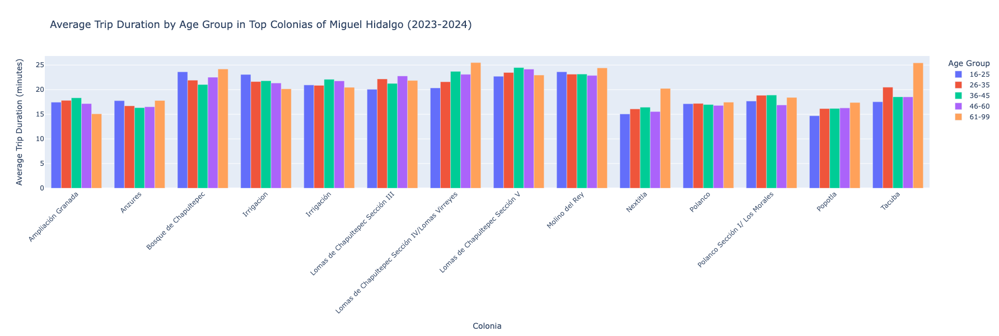

### Very close numbers for most colonias
### 61-99 age group stand out as leader for Nextila, tacuba and lomas chapu secion IV and molino del rey
### bosque chapu has 16-25 as second highest

In [ ]:
# Group by 'Colonia' and 'Gender' and count the number of trips
trip_count_per_colonia_gender = filtered_data_count.groupby(['Colonia', 'Gender']).size().reset_index(name='Trip_Count')

# Create a bar chart
fig = px.bar(trip_count_per_colonia_gender, x='Colonia', y='Trip_Count', color='Gender', barmode='group', color_discrete_map=gender_colors,
             title='Trip Counts for Each Gender in Top Colonias of Miguel Hidalgo (2023-2024)',
             labels={'Colonia': 'Colonia', 'Trip_Count': 'Number of Trips', 'Gender': 'Gender'})

# Customize the layout for better readability
fig.update_layout(
    xaxis_title='Colonia',
    yaxis_title='Number of Trips',
    xaxis_tickangle=-45,
    title_font_size=18,
    xaxis_title_font_size=14,
    yaxis_title_font_size=14,
    height=600  # Set the height of the chart
)

# Show the plot
fig.show()

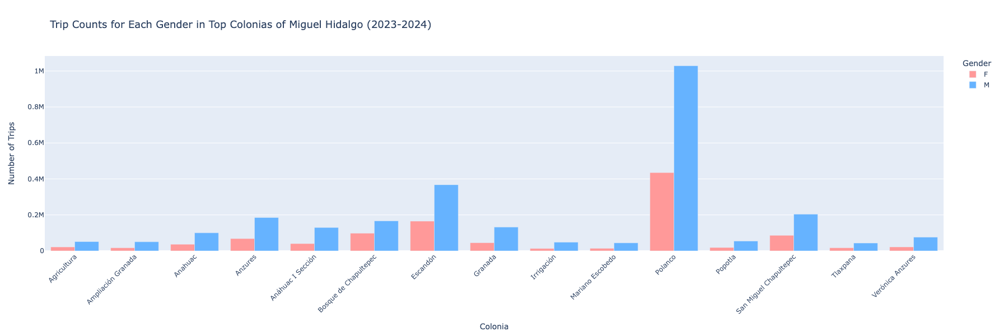

### Gender stats show males lead by about or more than half compared to females 

In [ ]:
# Group by 'Colonia' and 'Gender' and calculate the average trip duration
avg_trip_duration_per_colonia_gender = filtered_data.groupby(['Colonia', 'Gender'])['Trip_Duration'].mean().reset_index(name='Avg_Trip_Duration')

# Create a bar chart
fig = px.bar(avg_trip_duration_per_colonia_gender, x='Colonia', y='Avg_Trip_Duration', color='Gender', barmode='group', color_discrete_map=gender_colors,
             title='Average Trip Duration by Gender in Top Colonias of Miguel Hidalgo (2023-2024)',
             labels={'Colonia': 'Colonia', 'Avg_Trip_Duration': 'Average Trip Duration (minutes)', 'Gender': 'Gender'})

# Customize the layout for better readability
fig.update_layout(
    xaxis_title='Colonia',
    yaxis_title='Average Trip Duration (minutes)',
    xaxis_tickangle=-45,
    title_font_size=18,
    xaxis_title_font_size=14,
    yaxis_title_font_size=14,
    height=600  # Set the height of the chart
)

# Show the plot
fig.show()

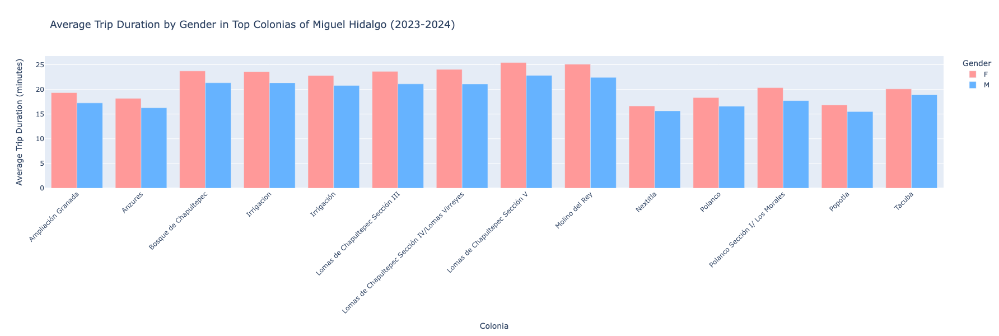

### Females lead but the difference is far less than in benito juarez

In [ ]:
# Calculate the total number of individuals in each colonia
total_count_per_colonia = miguel_hidalgo_data.groupby('Colonia').size().reset_index(name='Total_Count')

# Calculate the number of females in each colonia
female_count_per_colonia = miguel_hidalgo_data[miguel_hidalgo_data['Gender'] == 'F'].groupby('Colonia').size().reset_index(name='Female_Count')

# Merge the total count and female count dataframes
merged_data = total_count_per_colonia.merge(female_count_per_colonia, on='Colonia')

# Calculate the percentage of females in each colonia
merged_data['Female_Percentage'] = (merged_data['Female_Count'] / merged_data['Total_Count']) * 100

# Sort the data by the percentage of females and select the top 10 colonias
top_10_female_percentage_colonias = merged_data.sort_values(by='Female_Percentage', ascending=False).head(10)

# Create a bar chart for the top 10 colonias with the highest percentage of females
fig = px.bar(top_10_female_percentage_colonias, x='Colonia', y='Female_Percentage', color='Colonia',
             title='Top 10 Colonias in Miguel Hidalgo with the Highest Percentage of Females',
             labels={'Colonia': 'Colonia', 'Female_Percentage': 'Percentage of Females'})

# Customize the layout for better readability
fig.update_layout(
    xaxis_title='Colonia',
    yaxis_title='Percentage of Females',
    title_font_size=18,
    xaxis_title_font_size=14,
    yaxis_title_font_size=14,
    height=600  # Set the height of the chart
)

# Show the plot
fig.show()

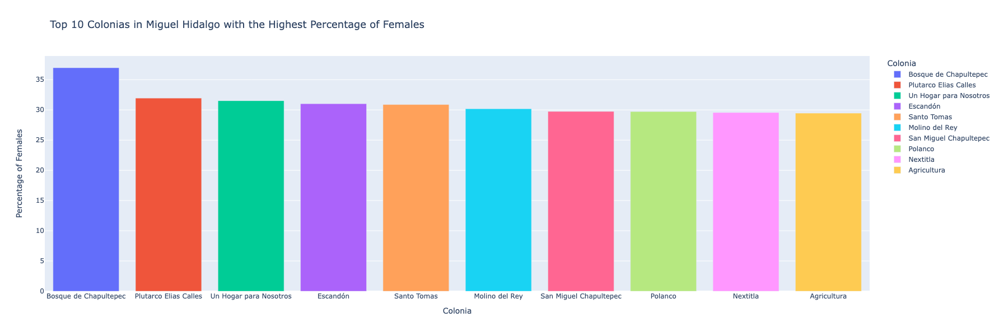

### bosque de chapultepec stands out as the colonia with the highest percentage of females with 36.9 %
### This colonia is key for marketting strategies to increase female usage
### other colonias fall right at 30% percent which is the overal percentage of females in general

In [ ]:
# Calculate the total number of individuals in each colonia and age group
total_count_per_colonia_age = miguel_hidalgo_data.groupby(['Colonia', 'Age_Group']).size().reset_index(name='Total_Count')

# Calculate the number of females in each colonia and age group
female_count_per_colonia_age = miguel_hidalgo_data[miguel_hidalgo_data['Gender'] == 'F'].groupby(['Colonia', 'Age_Group']).size().reset_index(name='Female_Count')

# Merge the total count and female count dataframes
merged_data_age = total_count_per_colonia_age.merge(female_count_per_colonia_age, on=['Colonia', 'Age_Group'], how='left').fillna(0)

# Calculate the percentage of females in each colonia and age group
merged_data_age['Female_Percentage'] = (merged_data_age['Female_Count'] / merged_data_age['Total_Count']) * 100

# Calculate overall percentage of females in each colonia
overall_female_percentage = merged_data_age.groupby('Colonia')['Female_Count'].sum() / merged_data_age.groupby('Colonia')['Total_Count'].sum() * 100
overall_female_percentage = overall_female_percentage.reset_index(name='Overall_Female_Percentage')

# Merge the overall female percentage with the age group data
merged_data_age = merged_data_age.merge(overall_female_percentage, on='Colonia')

# Sort the data by the overall percentage of females and select the top 10 colonias
top_10_colonias = overall_female_percentage.sort_values(by='Overall_Female_Percentage', ascending=False).head(10)['Colonia']
filtered_data_age = merged_data_age[merged_data_age['Colonia'].isin(top_10_colonias)]

# Create a grouped bar chart for the top 10 colonias with the highest percentage of females by age group
fig = px.bar(filtered_data_age, x='Colonia', y='Female_Percentage', color='Age_Group', barmode='group',
             title='Top 10 Colonias in Miguel Hidalgo with the Highest Percentage of Females by Age Group',
             labels={'Colonia': 'Colonia', 'Female_Percentage': 'Percentage of Females'})

# Customize the layout for better readability
fig.update_layout(
    xaxis_title='Colonia',
    yaxis_title='Percentage of Females',
    title_font_size=18,
    xaxis_title_font_size=14,
    yaxis_title_font_size=14,
    height=600  # Set the height of the chart
)

# Show the plot
fig.show()

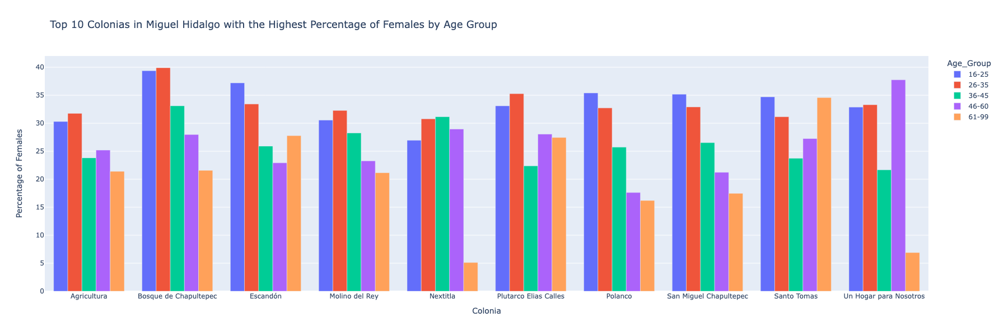

### Most colonias show that age group 16-25 and 26-35 lead for females in highest percentage
### Santo Tomas shows a high percentage of 61-99
### Un Hogar para Nosotros shows 46-60 with 37% females

In [ ]:
# Group by 'Station_ID' and count the number of trips for all stations
trip_count_per_station = miguel_hidalgo_data.groupby(['Station_ID', 'Colonia', 'Latitude', 'Longitude']).size().reset_index(name='Trip_Count')
all_stations = trip_count_per_station.sort_values(by='Trip_Count', ascending=False)

# Generate a color map for the colonias
colonias = all_stations['Colonia'].unique()
colors = plt.cm.get_cmap('tab20', len(colonias)).colors  # 'tab20' is a colormap with 20 colors
color_map = {colonia: colors[i % 20] for i, colonia in enumerate(colonias)}
color_map_hex = {colonia: mcolors.rgb2hex(color) for colonia, color in color_map.items()}

# Create a Folium map centered at the mean latitude and longitude of all stations
mean_lat_lon = all_stations[['Latitude', 'Longitude']].mean()
map_center = [mean_lat_lon['Latitude'], mean_lat_lon['Longitude']]
mymap = folium.Map(location=map_center, zoom_start=14)

# Add a polygon layer for the Miguel Hidalgo boundary
folium.Polygon(
    locations=hull_coords,
    color='blue',
    fill=True,
    fill_opacity=0.2,
    weight=2,
    popup='Miguel Hidalgo Area'
).add_to(mymap)

# Add a marker for each of the stations with color based on Colonia
for idx, row in all_stations.iterrows():
    folium.Marker(
        location=[row['Latitude'], row['Longitude']],
        popup=f"Station: {row['Station_ID']}<br>Colonia: {row['Colonia']}<br>Trip Count: {row['Trip_Count']}",
        icon=folium.Icon(color='blue', icon_color=color_map_hex[row['Colonia']])
    ).add_to(mymap)

# Add a title to the map
title_html = '''
     <div style="position: fixed; 
     top: 10px; left: 50%; transform: translateX(-50%); width: auto; height: auto; 
     background-color: white; z-index:9999; font-size:22px;
     border:2px solid grey; border-radius: 10px; padding: 5px;">
     <b>Colonias and Stations for Miguel Hidalgo</b>
     </div>
     '''
mymap.get_root().html.add_child(folium.Element(title_html))    

legend_html = '''
     <div style="position: absolute; 
     top: 60px; left: 50px; width: 300px; height: auto; 
     background-color: white; z-index:9999; font-size:14px;
     border:2px solid grey; border-radius: 10px; padding: 16px;">
     <b>Colonias</b><br>
     <div style="display: grid; grid-template-columns: 1fr 1fr; gap: 5px;">
     '''
for colonia in colonias:
    legend_html += f'<div><i style="background:{color_map_hex[colonia]}; width: 15px; height: 15px; display: inline-block;"></i> {colonia}</div>'
legend_html += '</div></div>'

mymap.get_root().html.add_child(folium.Element(legend_html))

# Display the map
mymap

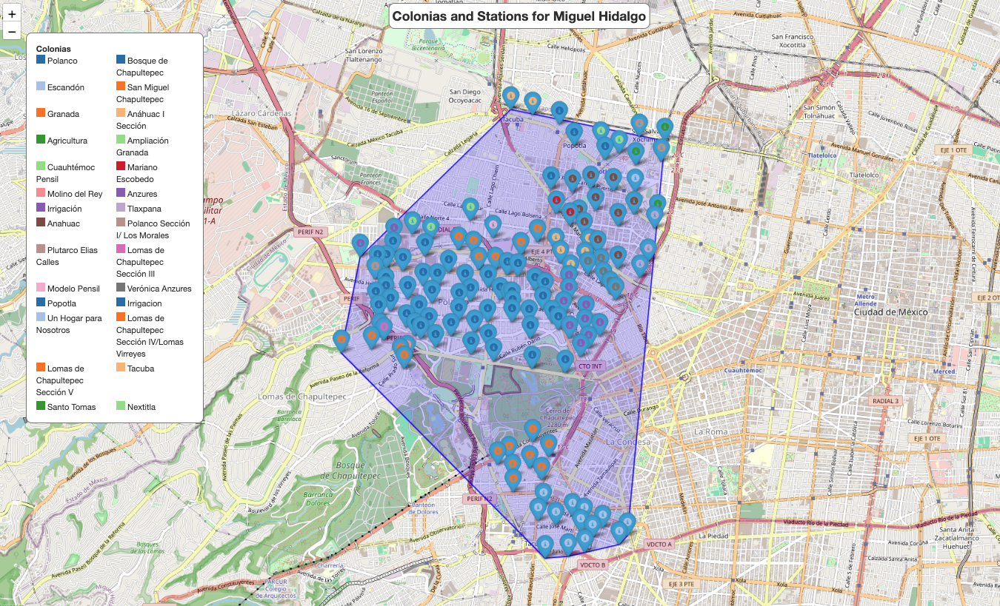

In [ ]:
# Sort the data by the percentage of females and select the top 10 colonias
top_10_female_percentage_colonias = merged_data.sort_values(by='Female_Percentage', ascending=False).head(10)

# Filter the original data to include only the stations in the top colonias
top_colonias = top_10_female_percentage_colonias['Colonia'].unique()
filtered_data = miguel_hidalgo_data[miguel_hidalgo_data['Colonia'].isin(top_colonias)]

# Extract coordinates for all unique stations in Benito Juárez data
coords = miguel_hidalgo_data[['Latitude', 'Longitude']].drop_duplicates().values

# Compute the convex hull for all unique stations
hull = ConvexHull(coords)
hull_coords = [coords[vertex].tolist() for vertex in hull.vertices] + [coords[hull.vertices[0]].tolist()]

# Group by 'Station_ID' and count the number of trips for the stations in top colonias
trip_count_per_station = filtered_data.groupby(['Station_ID', 'Colonia', 'Latitude', 'Longitude']).size().reset_index(name='Trip_Count')

# Calculate the number of females in each colonia and station
female_count_per_station = filtered_data[filtered_data['Gender'] == 'F'].groupby(['Station_ID', 'Colonia', 'Latitude', 'Longitude']).size().reset_index(name='Female_Count')

# Merge trip count and female count dataframes
merged_station_data = trip_count_per_station.merge(female_count_per_station, on=['Station_ID', 'Colonia', 'Latitude', 'Longitude'], how='left').fillna(0)
merged_station_data['Female_Percentage'] = (merged_station_data['Female_Count'] / merged_station_data['Trip_Count']) * 100

# Sort the stations by Female_Percentage and get the top stations
top_stations = merged_station_data.sort_values(by='Female_Percentage', ascending=False).head(15)

# Generate a color map for the colonias (only those present in the filtered data)
colonias = top_stations['Colonia'].unique()
colors = plt.cm.get_cmap('tab20', len(colonias)).colors  # 'tab20' is a colormap with 20 colors
color_map = {colonia: colors[i % 20] for i, colonia in enumerate(colonias)}
color_map_hex = {colonia: mcolors.rgb2hex(color) for colonia, color in color_map.items()}

# Create a Folium map centered at the mean latitude and longitude of the top stations
mean_lat_lon = top_stations[['Latitude', 'Longitude']].mean()
map_center = [mean_lat_lon['Latitude'], mean_lat_lon['Longitude']]
mymap = folium.Map(location=map_center, zoom_start=14)

# Add a polygon layer for the Benito Juárez boundary
folium.Polygon(
    locations=hull_coords,
    color='blue',
    fill=True,
    fill_opacity=0.2,
    weight=2,
    popup='Benito Juárez Area'
).add_to(mymap)

# Add a marker for each of the stations with color based on Colonia
for idx, row in top_stations.iterrows():
    folium.Marker(
        location=[row['Latitude'], row['Longitude']],
        popup=f"Station: {row['Station_ID']}<br>Colonia: {row['Colonia']}<br>Female Percentage: {row['Female_Percentage']:.2f}%",
        icon=folium.Icon(color='blue', icon_color=color_map_hex[row['Colonia']])
    ).add_to(mymap)
    
# Add a title to the map
title_html = '''
     <div style="position: fixed; 
     top: 10px; left: 50%; transform: translateX(-50%); width: auto; height: auto; 
     background-color: white; z-index:9999; font-size:22px;
     border:2px solid grey; border-radius: 10px; padding: 5px;">
     <b>Top Stations with Highest Female Usage in Miguel Hidalgo</b>
     </div>
     '''
mymap.get_root().html.add_child(folium.Element(title_html))

# Create a legend for the colonias (only those present in the map)
legend_html = '''
     <div style="position: absolute; 
     top: 60px; left: 50px; width: 300px; height: auto; 
     background-color: white; z-index:9999; font-size:14px;
     border:2px solid grey; border-radius: 10px; padding: 16px;">
     <b>Colonias</b><br>
     <div style="display: grid; grid-template-columns: 1fr 1fr; gap: 5px;">
     '''
for colonia in colonias:
    legend_html += f'<div><i style="background:{color_map_hex[colonia]}; width: 15px; height: 15px; display: inline-block;"></i> {colonia}</div>'
legend_html += '</div></div>'

mymap.get_root().html.add_child(folium.Element(legend_html))

# Display the map
mymap

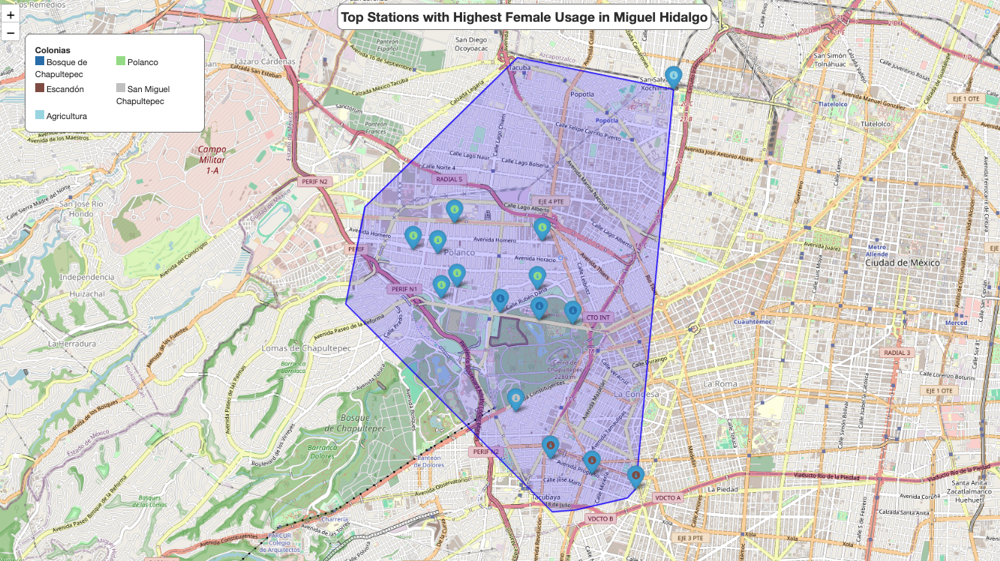

### Above are the stations with the highest female percentage 
### bosque de chapu which has the highest percentage of females is located right in the middle of Miguel Hidalgo 

In [ ]:
# Calculate the average trip count per day for each colonia
avg_trip_count_per_colonia_day = miguel_hidalgo_data.groupby(['Colonia', 'Week_Day'])['Trip_Duration'].size().reset_index(name='Trip_Count')

avg_trip_count_per_colonia_day = avg_trip_count_per_colonia_day.groupby(['Colonia', 'Week_Day']).mean().reset_index()

# Sort the data to get the top 10 colonias by average trip count
top_10_colonias = avg_trip_count_per_colonia_day.groupby('Colonia')['Trip_Count'].mean().sort_values(ascending=False).head(10).index

filtered_avg_trip_count = avg_trip_count_per_colonia_day[avg_trip_count_per_colonia_day['Colonia'].isin(top_10_colonias)]

# Create a grouped bar plot for the average trip count for top 10 colonias per day of the week
fig = px.bar(filtered_avg_trip_count, 
             x='Week_Day', 
             y='Trip_Count', 
             color='Colonia', 
             barmode='group',
             title='Average Trip Count for Top 10 Colonias per Day of the Week',
             labels={'Week_Day': 'Day of the Week', 'Trip_Count': 'Average Trip Count'},
             height=600, 
             width=1700)

# Customize the layout for better readability
fig.update_layout(
    xaxis_title='Day of the Week',
    yaxis_title='Average Trip Count',
    title_font_size=18,
    xaxis_title_font_size=14,
    yaxis_title_font_size=14,
    legend=dict(
        x=0.85,
        y=1.03,
        bgcolor='rgba(255, 255, 255, 0.5)',  # Background color with some transparency
        bordercolor='Black',
        borderwidth=2
    )
)

# Show the plot
fig.show()

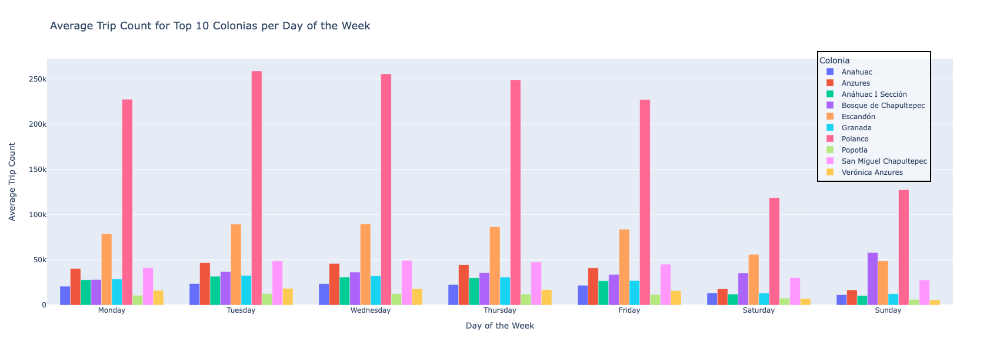

## Daily trips are led by polanco
### focusing on the other colonias is key to increasing ride users
### Escandon is the second but it is a small colonia and has above 10 stations
### Anzures and San miguel chapultepec, bosque chapultepec should be the focus to increase usage
### sunday has bosque chapu as the second most active which makes sense since people love to go to parks on sundays
### anzures has 9 stations and bosque chapu has 3 
### bosque chapu could benefit from having alot more bike docks and not stations while anzures has 9 which makes it top 4th 

In [ ]:
# Calculate the average trip duration per day for each colonia
avg_trip_duration_per_colonia_day = miguel_hidalgo_data.groupby(['Colonia', 'Week_Day'])['Trip_Duration'].mean().reset_index(name='Avg_Trip_Duration')

# Sort the data to get the top 10 colonias by average trip duration
top_10_colonias = avg_trip_duration_per_colonia_day.groupby('Colonia')['Avg_Trip_Duration'].mean().sort_values(ascending=False).head(10).index

# Filter the data to include only the top 10 colonias
filtered_avg_trip_duration = avg_trip_duration_per_colonia_day[avg_trip_duration_per_colonia_day['Colonia'].isin(top_10_colonias)]

# Create a grouped bar plot for the average trip duration for top 10 colonias per day of the week
fig = px.bar(filtered_avg_trip_duration, 
             x='Week_Day', 
             y='Avg_Trip_Duration', 
             color='Colonia', 
             barmode='group',
             title='Top 10 Colonias with highest Trip Duration per Day of the Week',
             labels={'Week_Day': 'Day of the Week', 'Avg_Trip_Duration': 'Average Trip Duration (minutes)'},
             height=600, 
             width=1600)

fig.update_layout(
    xaxis_title='Day of the Week',
    yaxis_title='Average Trip Duration (minutes)',
    title_font_size=18,
    xaxis_title_font_size=14,
    yaxis_title_font_size=14,
    legend=dict(
        orientation='h',  # Set legend orientation to horizontal
        yanchor='bottom',
        y=.9,
        xanchor='right',
        x=1
    )
)

# Show the plot
fig.show()

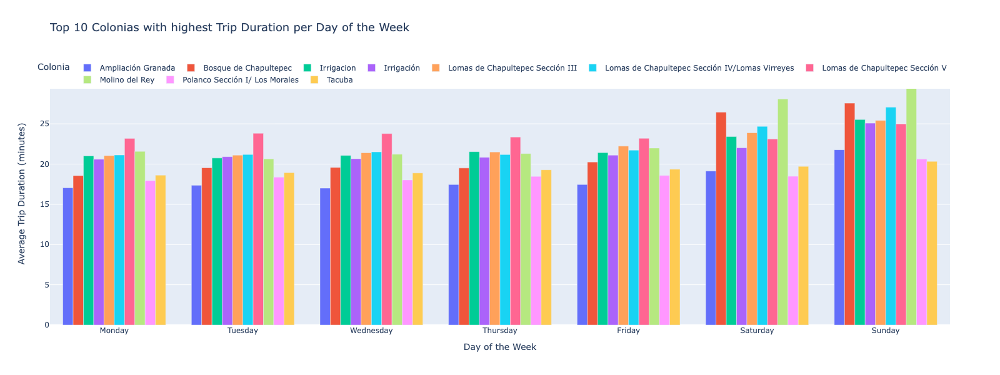

In [ ]:
# Generate a color map for the colonias (only those present in the filtered data)
colonias = filtered_avg_trip_duration['Colonia'].unique()
colors = plt.cm.get_cmap('tab10', len(colonias)).colors  # 'tab20' is a colormap with 20 colors
color_map = {colonia: colors[i % 20] for i, colonia in enumerate(colonias)}
color_map_hex = {colonia: mcolors.rgb2hex(color) for colonia, color in color_map.items()}

# Filter the original data to include only the stations in the top colonias
filtered_data = miguel_hidalgo_data[miguel_hidalgo_data['Colonia'].isin(colonias)]

# Group by 'Station_ID' and get unique coordinates for each station in top colonias
station_data = filtered_data.groupby(['Station_ID', 'Colonia', 'Latitude', 'Longitude']).size().reset_index(name='Trip_Count')

# Extract coordinates for all unique stations in Miguel Hidalgo data
coords = miguel_hidalgo_data[['Latitude', 'Longitude']].drop_duplicates().values

# Compute the convex hull for all unique stations
hull = ConvexHull(coords)
hull_coords = [coords[vertex].tolist() for vertex in hull.vertices] + [coords[hull.vertices[0]].tolist()]

# Create a Folium map centered at the mean latitude and longitude of the stations
mean_lat_lon = station_data[['Latitude', 'Longitude']].mean()
map_center = [mean_lat_lon['Latitude'], mean_lat_lon['Longitude']]
mymap = folium.Map(location=map_center, zoom_start=14)

# Add a polygon layer for the Miguel Hidalgo boundary
folium.Polygon(
    locations=hull_coords,
    color='blue',
    fill=True,
    fill_opacity=0.2,
    weight=2,
    popup='Miguel Hidalgo Area'
).add_to(mymap)

# Add a marker for each of the stations with color based on Colonia
for idx, row in station_data.iterrows():
    folium.Marker(
        location=[row['Latitude'], row['Longitude']],
        popup=f"Station: {row['Station_ID']}<br>Colonia: {row['Colonia']}<br>Trip Count: {row['Trip_Count']}",
        icon=folium.Icon(color='blue', icon_color=color_map_hex[row['Colonia']])
    ).add_to(mymap)

# Add a title to the map
title_html = '''
     <div style="position: fixed; 
     top: 10px; left: 60%; transform: translateX(-50%); width: auto; height: auto; 
     background-color: white; z-index:9999; font-size:22px;
     border:2px solid grey; border-radius: 10px; padding: 5px;">
     <b>Top Stations in Colonias with Highest Average Trip Duration in Miguel Hidalgo</b>
     </div>
     '''
mymap.get_root().html.add_child(folium.Element(title_html))

# Create a legend for the colonias (only those present in the map)
legend_html = '''
     <div style="position: absolute; 
     top: 60px; left: 50px; width: 390px; height: auto; 
     background-color: white; z-index:9999; font-size:14px;
     border:2px solid grey; border-radius: 10px; padding: 16px;">
     <b>Colonias</b><br>
     <div style="display: grid; grid-template-columns: repeat(5, 1fr); gap: 5px;">
     '''
for colonia in colonias:
    legend_html += f'<div><i style="background:{color_map_hex[colonia]}; width: 15px; height: 15px; display: inline-block;"></i> {colonia}</div>'
legend_html += '</div></div>'

mymap.get_root().html.add_child(folium.Element(legend_html))

# Display the map
mymap

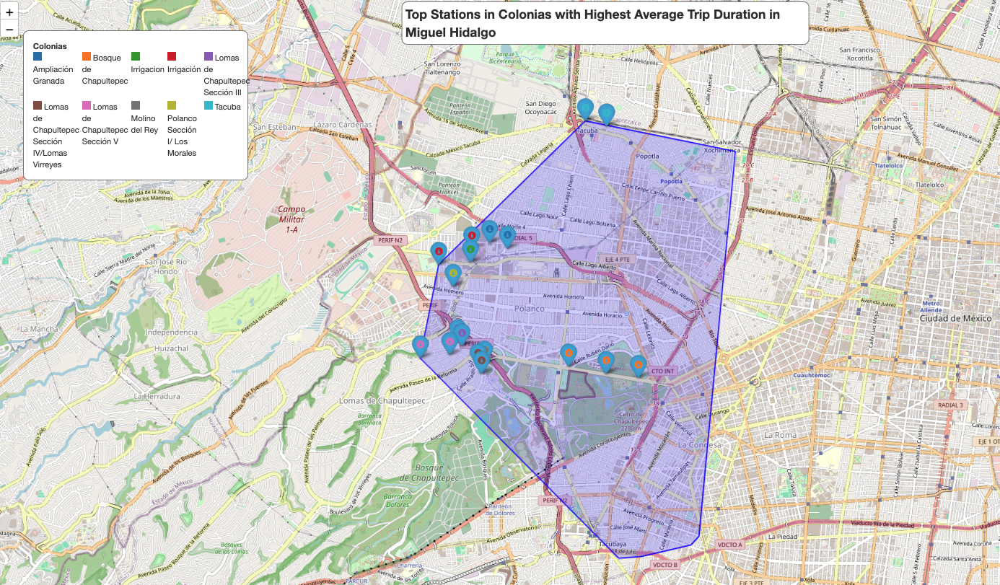

### Most of of the colonias are located on the edge of miguel hidalgo's boundries
### This can indicate that users in these areas are cummuting to areas further away within Miguel Hidalgo or other alcaldias 
### Also the the 3 stations in bosque chapu are located on a very popular avenues which can allow riders to transit further into cuauhtemoc

In [ ]:
# Calculate the number of trips made by females and males for each colonia
gender_counts = filtered_data.groupby(['Colonia', 'Gender']).size().reset_index(name='Count')

# Calculate the total number of trips for each colonia
total_counts = gender_counts.groupby('Colonia')['Count'].sum().reset_index(name='Total_Count')

# Merge the gender counts with the total counts to calculate percentages
merged_data = pd.merge(gender_counts, total_counts, on='Colonia')
merged_data['Percentage'] = (merged_data['Count'] / merged_data['Total_Count']) * 100

# Define color mapping for age groups
color_map = {
    'F': 'pink',
    'M': 'blue'
}

# Create a stacked bar chart to show the gender distribution as percentages for each colonia
fig = px.bar(merged_data, 
             x='Colonia', 
             y='Percentage', 
             color='Gender', 
             title='Gender Distribution in Top 10 Colonias by Average Trip Duration',
             labels={'Colonia': 'Colonia', 'Percentage': 'Percentage of Trips'},
             height=600, 
             width=1600,
             barmode='group',
             color_discrete_map=color_map)

fig.update_layout(
    xaxis_title='Colonia',
    yaxis_title='Percentage of Trips',
    title_font_size=18,
    xaxis_title_font_size=14,
    yaxis_title_font_size=14,
    legend=dict(
        orientation='h',  # Set legend orientation to horizontal
        yanchor='bottom',
        y=1.02,
        xanchor='right',
        x=1
    )
)

# Show the plot
fig.show()

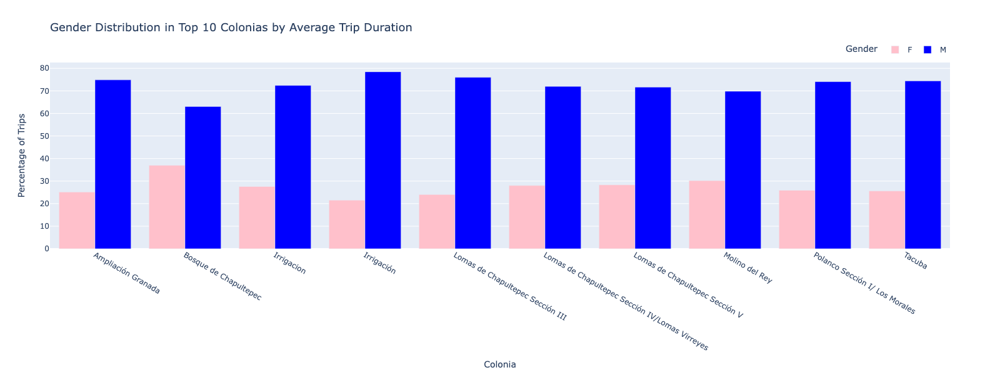

### Gender distribution for the top 10 colonias by average trip duration shows that Bosque de Chapultepec has the highest percentage 
### with 36.9% females
### This area can also be very usefull for targetting female usage

In [ ]:
# Calculate the number of trips made by each age group for each colonia
age_group_counts = filtered_data.groupby(['Colonia', 'Age_Group']).size().reset_index(name='Count')

# Calculate the total number of trips for each colonia
total_counts = age_group_counts.groupby('Colonia')['Count'].sum().reset_index(name='Total_Count')

# Merge the age group counts with the total counts to calculate percentages
merged_data = pd.merge(age_group_counts, total_counts, on='Colonia')
merged_data['Percentage'] = (merged_data['Count'] / merged_data['Total_Count']) * 100


# Create a stacked bar chart to show the age group distribution as percentages for each colonia
fig = px.bar(merged_data, 
             x='Colonia', 
             y='Percentage', 
             color='Age_Group', 
             title='Age Group Distribution in Top 10 Colonias by Average Trip Duration',
             labels={'Colonia': 'Colonia', 'Percentage': 'Percentage of Trips'},
             height=600, 
             width=1600,
             barmode='stack',
             color_discrete_map=color_map)

fig.update_layout(
    xaxis_title='Colonia',
    yaxis_title='Percentage of Trips',
    title_font_size=18,
    xaxis_title_font_size=14,
    yaxis_title_font_size=14,
    legend=dict(
        orientation='h',  # Set legend orientation to horizontal
        yanchor='bottom',
        y=1.02,
        xanchor='right',
        x=1
    )
)

# Show the plot
fig.show()

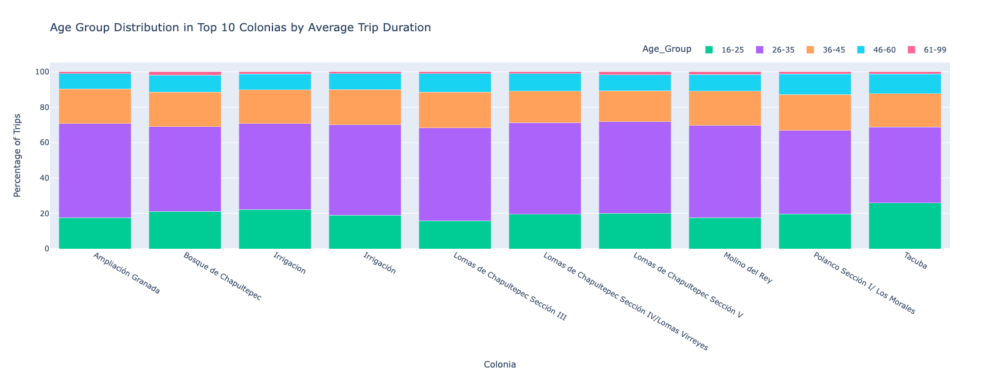

### Tacuba shows 25% for 16-25 age group 
### many colonias are in between 16-25 and 36-45 age groups for second place 
### age group 61-99 is very low, lower than benito juarez

In [ ]:
# Calculate the average trip duration for each age group per day of the week
avg_trip_duration_per_age_group_day = miguel_hidalgo_data.groupby(['Age_Group', 'Week_Day'])['Trip_Duration'].mean().reset_index()

# Create the line chart with Plotly
fig = px.line(avg_trip_duration_per_age_group_day, 
              x='Week_Day', 
              y='Trip_Duration', 
              color='Age_Group', 
              title='Average Trip Duration per Age Group by Day of the Week for Miguel Hidalgo',
              labels={'Week_Day': 'Day of the Week', 'Trip_Duration': 'Average Trip Duration (minutes)'},
              markers=True,
              height=600, 
              width=1700,
              color_discrete_map=color_map)

fig.update_layout(
    xaxis_title='Day of the Week',
    yaxis_title='Average Trip Duration (minutes)',
    title_font_size=18,
    xaxis_title_font_size=14,
    yaxis_title_font_size=14,
    legend=dict(
        orientation='h',
        yanchor='bottom',
        y=1.02,
        xanchor='right',
        x=1
    )
)

# Show the plot
fig.show()

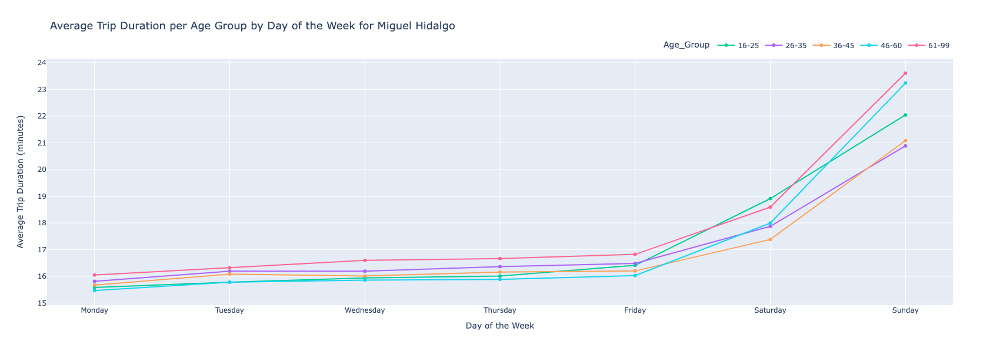

### 61-99 age group leads for highest avg trip duration for every single day but saturday

In [ ]:
# Filter the data for the age group 46-60
age_group_61_99_data = miguel_hidalgo_data[miguel_hidalgo_data['Age_Group'] == '61-99']

# Calculate the total trips for each colonia per day of the week
total_trips_per_colonia_day = miguel_hidalgo_data.groupby(['Colonia', 'Week_Day']).size().reset_index(name='Total_Trips')

# Calculate the trips for the age group 46-60 for each colonia per day of the week
age_group_trips_per_colonia_day = age_group_61_99_data.groupby(['Colonia', 'Week_Day']).size().reset_index(name='Age_Group_Trips')

# Merge the dataframes to get total trips and age group trips together
merged_data = pd.merge(age_group_trips_per_colonia_day, total_trips_per_colonia_day, on=['Colonia', 'Week_Day'])

# Calculate the percentage of trips for the age group 46-60
merged_data['Percentage_Age_Group_61_99'] = (merged_data['Age_Group_Trips'] / merged_data['Total_Trips']) * 100

# Identify the top 10 colonias with the highest percentage for each day
top_10_colonias_per_day = merged_data.groupby('Week_Day').apply(lambda x: x.nlargest(10, 'Percentage_Age_Group_61_99')).reset_index(drop=True)

# Create a bar chart using Plotly
fig = px.bar(top_10_colonias_per_day, 
             x='Week_Day', 
             y='Percentage_Age_Group_61_99', 
             color='Colonia', 
             title='Top 10 Colonias with Highest Percentage of Age Group 61-99 by Day of the Week',
             labels={'Week_Day': 'Day of the Week', 'Percentage_Age_Group_61_99': 'Percentage of Age Group 61-99 (%)'},
             height=600, 
             width=1600,
             barmode='group')

fig.update_layout(
    xaxis_title='Day of the Week',
    yaxis_title='Percentage of Age Group 61-99 (%)',
    title_font_size=18,
    xaxis_title_font_size=14,
    yaxis_title_font_size=14,
    legend=dict(
        orientation='v',
        yanchor='top',
        y=1.02,
        xanchor='left',
        x=1.02
    )
)

# Show the plot
fig.show()

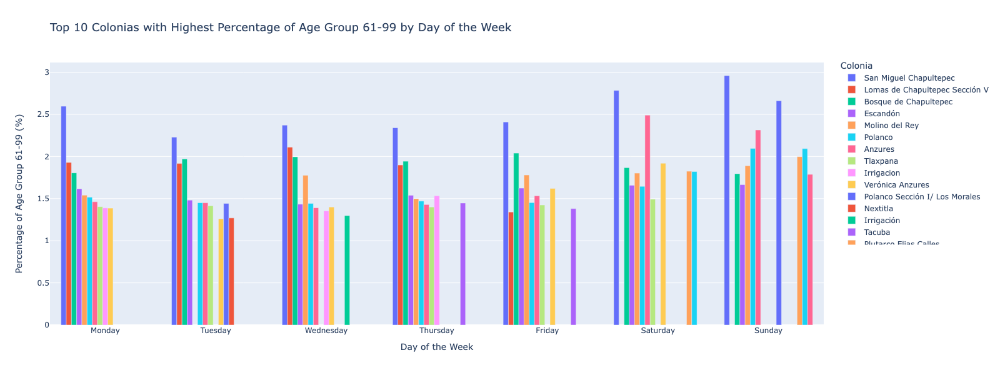

### Sunday is the busest day for age group 61-99 for colonia San Miguel Chapu and polanco seccion I
### Anzures busiest day is saturday
### Weekend overall has a higher percentage for 61-99 age group 

In [ ]:
# Filter the data for the age group 46-60
age_group_46_60_data = miguel_hidalgo_data[miguel_hidalgo_data['Age_Group'] == '46-60']

# Calculate the total trips for each colonia per day of the week
total_trips_per_colonia_day = miguel_hidalgo_data.groupby(['Colonia', 'Week_Day']).size().reset_index(name='Total_Trips')

# Calculate the trips for the age group 46-60 for each colonia per day of the week
age_group_trips_per_colonia_day = age_group_46_60_data.groupby(['Colonia', 'Week_Day']).size().reset_index(name='Age_Group_Trips')

# Merge the dataframes to get total trips and age group trips together
merged_data = pd.merge(age_group_trips_per_colonia_day, total_trips_per_colonia_day, on=['Colonia', 'Week_Day'])

# Calculate the percentage of trips for the age group 46-60
merged_data['Percentage_Age_Group_46_60'] = (merged_data['Age_Group_Trips'] / merged_data['Total_Trips']) * 100

# Identify the top 10 colonias with the highest percentage for each day
top_10_colonias_per_day = merged_data.groupby('Week_Day').apply(lambda x: x.nlargest(10, 'Percentage_Age_Group_46_60')).reset_index(drop=True)

# Create a bar chart using Plotly
fig = px.bar(top_10_colonias_per_day, 
             x='Week_Day', 
             y='Percentage_Age_Group_46_60', 
             color='Colonia', 
             title='Top 10 Colonias with Highest Percentage of Age Group 46-60 by Day of the Week',
             labels={'Week_Day': 'Day of the Week', 'Percentage_Age_Group_46_60': 'Percentage of Age Group 46-60 (%)'},
             height=600, 
             width=1600,
             barmode='group')

fig.update_layout(
    xaxis_title='Day of the Week',
    yaxis_title='Percentage of Age Group 46-60 (%)',
    title_font_size=18,
    xaxis_title_font_size=14,
    yaxis_title_font_size=14,
    legend=dict(
        orientation='v',
        yanchor='top',
        y=1.02,
        xanchor='left',
        x=1.02
    )
)

# Show the plot
fig.show()

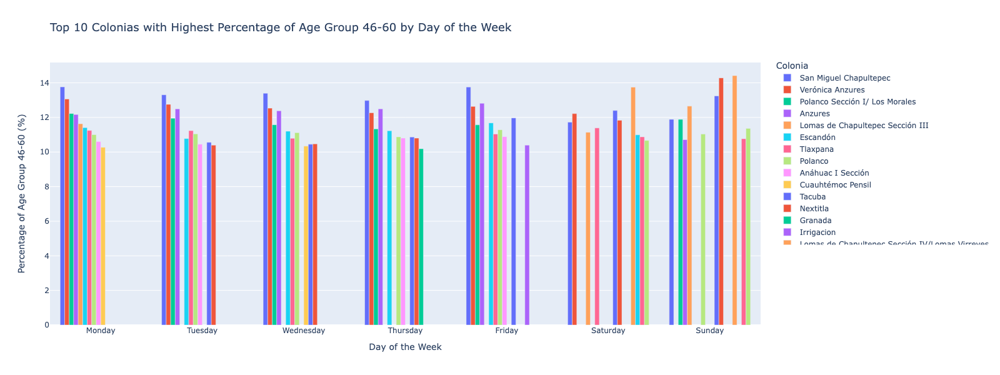

### San miguel Chapu shows consistent usage monday - friday for age group 46-60
### Weekend shows Lomas de Chapultepec and Nextila as the top colonias for 46060 age group percentage

In [ ]:
# Filter the data for the age group 46-60
age_group_36_45_data = miguel_hidalgo_data[miguel_hidalgo_data['Age_Group'] == '36-45']

# Calculate the total trips for each colonia per day of the week
total_trips_per_colonia_day = miguel_hidalgo_data.groupby(['Colonia', 'Week_Day']).size().reset_index(name='Total_Trips')

# Calculate the trips for the age group 46-60 for each colonia per day of the week
age_group_trips_per_colonia_day = age_group_36_45_data.groupby(['Colonia', 'Week_Day']).size().reset_index(name='Age_Group_Trips')

# Merge the dataframes to get total trips and age group trips together
merged_data = pd.merge(age_group_trips_per_colonia_day, total_trips_per_colonia_day, on=['Colonia', 'Week_Day'])

# Calculate the percentage of trips for the age group 46-60
merged_data['Percentage_Age_Group_36_45'] = (merged_data['Age_Group_Trips'] / merged_data['Total_Trips']) * 100

# Identify the top 10 colonias with the highest percentage for each day
top_10_colonias_per_day = merged_data.groupby('Week_Day').apply(lambda x: x.nlargest(10, 'Percentage_Age_Group_36_45')).reset_index(drop=True)

# Create a bar chart using Plotly
fig = px.bar(top_10_colonias_per_day, 
             x='Week_Day', 
             y='Percentage_Age_Group_36_45', 
             color='Colonia', 
             title='Top 10 Colonias with Highest Percentage of Age Group 36-45 by Day of the Week',
             labels={'Week_Day': 'Day of the Week', 'Percentage_Age_Group_36_45': 'Percentage of Age Group 36-45 (%)'},
             height=600, 
             width=1600,
             barmode='group')

fig.update_layout(
    xaxis_title='Day of the Week',
    yaxis_title='Percentage of Age Group 36-45 (%)',
    title_font_size=18,
    xaxis_title_font_size=14,
    yaxis_title_font_size=14,
    legend=dict(
        orientation='v',
        yanchor='top',
        y=1.02,
        xanchor='left',
        x=1.02
    )
)

# Show the plot
fig.show()

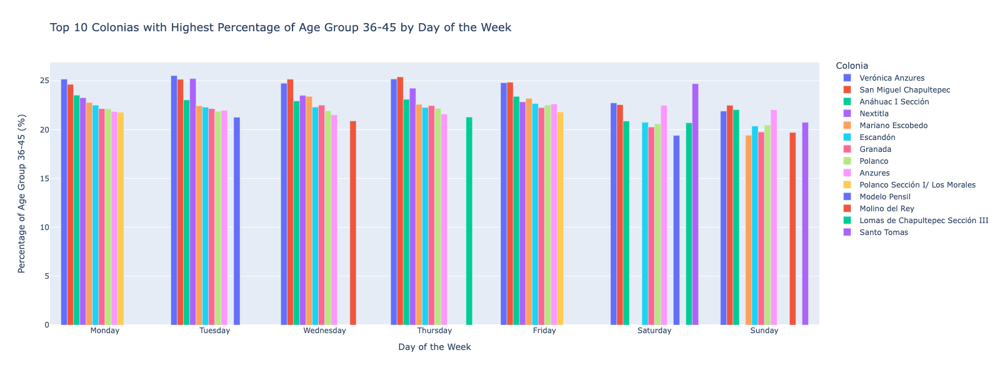

### Age group 36-45 shows that percentage drops on the weekend with Santo Tomas showing as the top colonia 
### Veronica anzures is the main colonia for the weekday to display close to 25% for 36-45 

In [ ]:
# Filter the data for the age group 46-60
age_group_26_35_data = miguel_hidalgo_data[miguel_hidalgo_data['Age_Group'] == '26-35']

# Calculate the total trips for each colonia per day of the week
total_trips_per_colonia_day = miguel_hidalgo_data.groupby(['Colonia', 'Week_Day']).size().reset_index(name='Total_Trips')

# Calculate the trips for the age group 46-60 for each colonia per day of the week
age_group_trips_per_colonia_day = age_group_26_35_data.groupby(['Colonia', 'Week_Day']).size().reset_index(name='Age_Group_Trips')

# Merge the dataframes to get total trips and age group trips together
merged_data = pd.merge(age_group_trips_per_colonia_day, total_trips_per_colonia_day, on=['Colonia', 'Week_Day'])

# Calculate the percentage of trips for the age group 46-60
merged_data['Percentage_Age_Group_26_35'] = (merged_data['Age_Group_Trips'] / merged_data['Total_Trips']) * 100

# Identify the top 10 colonias with the highest percentage for each day
top_10_colonias_per_day = merged_data.groupby('Week_Day').apply(lambda x: x.nlargest(10, 'Percentage_Age_Group_26_35')).reset_index(drop=True)

# Create a bar chart using Plotly
fig = px.bar(top_10_colonias_per_day, 
             x='Week_Day', 
             y='Percentage_Age_Group_26_35', 
             color='Colonia', 
             title='Top 10 Colonias with Highest Percentage of Age Group 26-35 by Day of the Week',
             labels={'Week_Day': 'Day of the Week', 'Percentage_Age_Group_26_35': 'Percentage of Age Group 26-35 (%)'},
             height=600, 
             width=1600,
             barmode='group')

fig.update_layout(
    xaxis_title='Day of the Week',
    yaxis_title='Percentage of Age Group 26-35 (%)',
    title_font_size=18,
    xaxis_title_font_size=14,
    yaxis_title_font_size=14,
    legend=dict(
        orientation='v',
        yanchor='top',
        y=1.02,
        xanchor='left',
        x=1.02
    )
)

# Show the plot
fig.show()

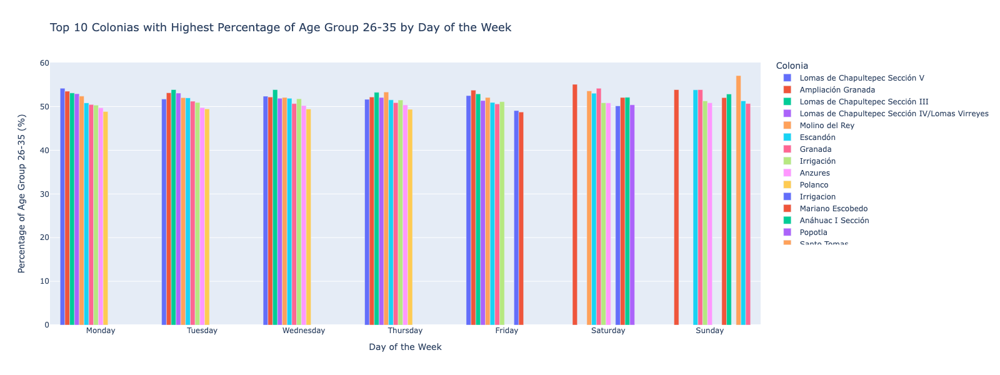

### 26-35 shows the least differences of age percentage between colonias per day
### Santo Tomas stands out for sunday with 57% 

In [ ]:
# Filter the data for the age group 46-60
age_group_16_25_data = miguel_hidalgo_data[miguel_hidalgo_data['Age_Group'] == '16-25']

# Calculate the total trips for each colonia per day of the week
total_trips_per_colonia_day = miguel_hidalgo_data.groupby(['Colonia', 'Week_Day']).size().reset_index(name='Total_Trips')

# Calculate the trips for the age group 46-60 for each colonia per day of the week
age_group_trips_per_colonia_day = age_group_16_25_data.groupby(['Colonia', 'Week_Day']).size().reset_index(name='Age_Group_Trips')

# Merge the dataframes to get total trips and age group trips together
merged_data = pd.merge(age_group_trips_per_colonia_day, total_trips_per_colonia_day, on=['Colonia', 'Week_Day'])

# Calculate the percentage of trips for the age group 46-60
merged_data['Percentage_Age_Group_16_25'] = (merged_data['Age_Group_Trips'] / merged_data['Total_Trips']) * 100

# Identify the top 10 colonias with the highest percentage for each day
top_10_colonias_per_day = merged_data.groupby('Week_Day').apply(lambda x: x.nlargest(10, 'Percentage_Age_Group_16_25')).reset_index(drop=True)

# Create a bar chart using Plotly
fig = px.bar(top_10_colonias_per_day, 
             x='Week_Day', 
             y='Percentage_Age_Group_16_25', 
             color='Colonia', 
             title='Top 10 Colonias with Highest Percentage of Age Group 16-25 by Day of the Week',
             labels={'Week_Day': 'Day of the Week', 'Percentage_Age_Group_16_25': 'Percentage of Age Group 16-25 (%)'},
             height=600, 
             width=1600,
             barmode='group')

fig.update_layout(
    xaxis_title='Day of the Week',
    yaxis_title='Percentage of Age Group 16-25 (%)',
    title_font_size=18,
    xaxis_title_font_size=14,
    yaxis_title_font_size=14,
    legend=dict(
        orientation='v',
        yanchor='top',
        y=1.02,
        xanchor='left',
        x=1.02
    )
)

# Show the plot
fig.show()

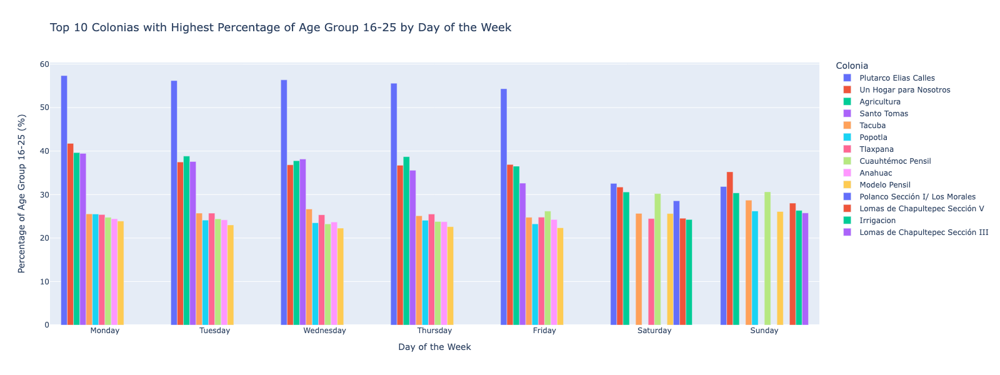

### 16-25 age group shows a huge percentage difference with Plutarco elias calles showing above 50% monday - friday
### Agricultura, Un hogas=r para ninos and Santo tomas are all very close between 30 - 40% 
### weekend shows not that much difference between colonias all btween 20-30% 